# Building a Resume Classification Model Using NLP Techniques

In this project, I will explore the development of a text classification model to categorize resumes into 24 predefined job categories (e.g., HR, IT, Finance, and more). The dataset consists of 2,400 resumes in PDF format, converted into structured CSV data for processing. It includes textual content (resume text) and metadata, enabling efficient pre-processing and feature extraction for building the classification model. The dataset can be accessed via Kaggle at [this link](https://www.kaggle.com/datasets/snehaanbhawal/resume-dataset).

The project involves leveraging Natural Language Processing (NLP) techniques to train a multi-class classification model. I used a transformer-based pre-trained language model, specifically BERT, to extract contextual embeddings from the resume texts. On top of these embeddings, we added a fully connected layer to fine-tune the model for our classification task. The model aims to accurately predict the job category of a resume, based on its textual content.

Performance metrics such as accuracy, precision, recall, and F1-score were used to evaluate the model's effectiveness in classifying resumes into categories. 

The ability to classify resumes into specific categories has significant applications in automating recruitment processes, enabling organizations to filter and sort resumes more efficiently. 

## 1. Import libraries

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
from wordcloud import WordCloud
import spacy
from tqdm import tqdm
from PIL import Image
import torch
from torch import nn
from transformers import BertForSequenceClassification
from transformers import DistilBertForSequenceClassification
from transformers import AutoTokenizer
from torch.utils.data import DataLoader, Dataset
from transformers import AdamW
from sklearn.metrics import accuracy_score
import numpy as np
from sklearn.model_selection import train_test_split
import time
from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay
import torch

import warnings
warnings.filterwarnings("ignore")

## 2. Data Preprocessing

In [2]:

def plot_word_cloud_high_quality(text, title, wordcloud_width, wordcloud_height, name_file, plot_width=10, plot_height=8):
    """
    Plots a high-quality word cloud with customizable display size.

    Args:
        text (list or pd.Series): The text data to generate the word cloud.
        title (str): Title of the plot.
        wordcloud_width (int): Width of the word cloud image (for resolution).
        wordcloud_height (int): Height of the word cloud image (for resolution).
        name_file (str): Name of file for saving (.png)
        plot_width (float): Width of the plot display in inches.
        plot_height (float): Height of the plot display in inches.
    """
    # Generate the word cloud
    wordcloud = WordCloud(width=wordcloud_width, height=wordcloud_height, background_color="white").generate(" ".join(text))
    
    # Resize the word cloud using Pillow
    resized_wordcloud = wordcloud.to_image().resize(
        (int(plot_width * 100), int(plot_height * 100)), Image.Resampling.LANCZOS
    )

    # Plot the resized word cloud
    plt.figure(figsize=(plot_width, plot_height))
    plt.imshow(resized_wordcloud, interpolation="bilinear")
    plt.axis("off")
    plt.title(title, fontsize=15)
    plt.savefig(f'.//figures//{name_file}', dpi=400, bbox_inches="tight")  
    plt.show()


In [3]:
def word_cloud_per_category(data, column_name, name_file):
    """
    Creates sub-plots (word cloud for each category) and save all of them as a png file.
    
    Args:
        data (DataFrame): It has the whole data
        column_name (str): The column that has the desired text
        name_file (str): Name of file for saving (.png)
    """
    
    categories = data[category_column].unique()
    fig, axes = plt.subplots(6, 4, figsize=(20, 25))
    fig.suptitle("Word Clouds by Category", fontsize=20)
    for ax, category in zip(axes.flatten(), categories):
        category_text = data[data[category_column] == category][column_name]
        wordcloud = WordCloud(width=400, height=200, background_color="white").generate(" ".join(category_text))
        ax.imshow(wordcloud, interpolation="bilinear")
        ax.axis("off")
        ax.set_title(category, fontsize=14)
    
    plt.subplots_adjust(hspace=0.1, top=0.8)
    plt.tight_layout(rect=[0, 0, 1, 1])
    plt.savefig(f'.//figures//{name_file}', dpi=400, bbox_inches="tight") 
    plt.show()

In [4]:
## Create a class for cleaning text using spaCy (large model)

class TextCleaner:
    def __init__(self, language_model="en_core_web_lg"):
        self.nlp = spacy.load(language_model)

    def clean_text(self, text):
        doc = self.nlp(text)
        clean_tokens = [token.lemma_.lower() for token in doc if not token.is_stop and not token.is_punct]
        return " ".join(clean_tokens)

### 2.1. Load dataset

In [5]:
file_path = "Resume.csv"  
data = pd.read_csv(file_path)

# Column containing the text and label
raw_text_column = "Resume_str"  
category_column = "Category"

### 2.2. Exploratory Data Analysis for Raw Text

#### Plot word cloud for entire dataset

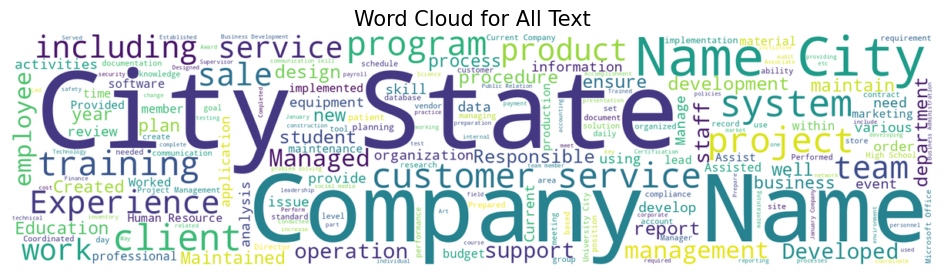

In [6]:
plot_word_cloud_high_quality(data[raw_text_column], "Word Cloud for All Text",
                wordcloud_width=1800, wordcloud_height=450, 
                name_file='word_cloud_raw_text.png', plot_width=12, 
                plot_height=3)

#### Plot word clouds for each category

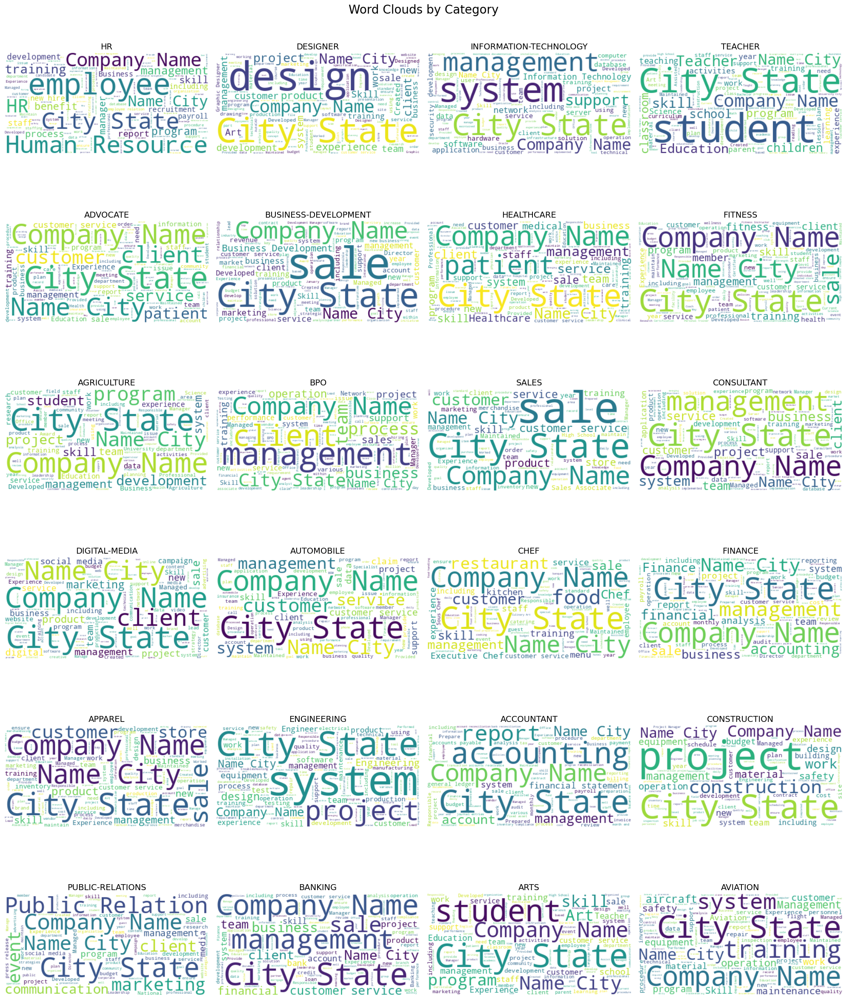

In [7]:
word_cloud_per_category(data, "Resume_str", "word_cloud_per_category_raw_text.png")

### 2.3. Exploratory Data Analysis for Cleaned Text

In [8]:
# Instantiate the cleaner
cleaner = TextCleaner()

data["cleaned_text"] = data[raw_text_column].apply(cleaner.clean_text)

#### Plot word cloud for entire cleaned dataset

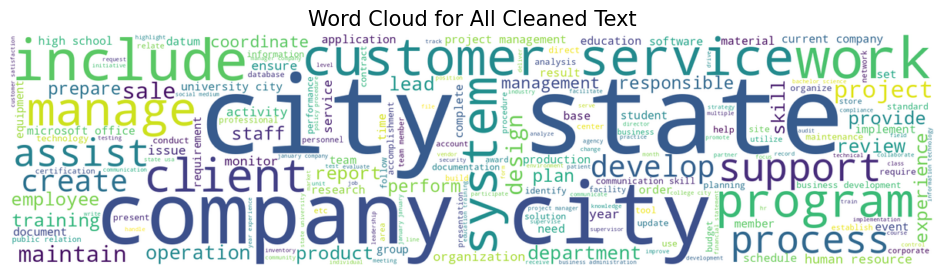

In [9]:
plot_word_cloud_high_quality(data["cleaned_text"], "Word Cloud for All Cleaned Text",
                wordcloud_width=1800, wordcloud_height=450, 
                name_file='word_cloud_cleaned_text.png', plot_width=12, 
                plot_height=3)

#### Plot word clouds for each category

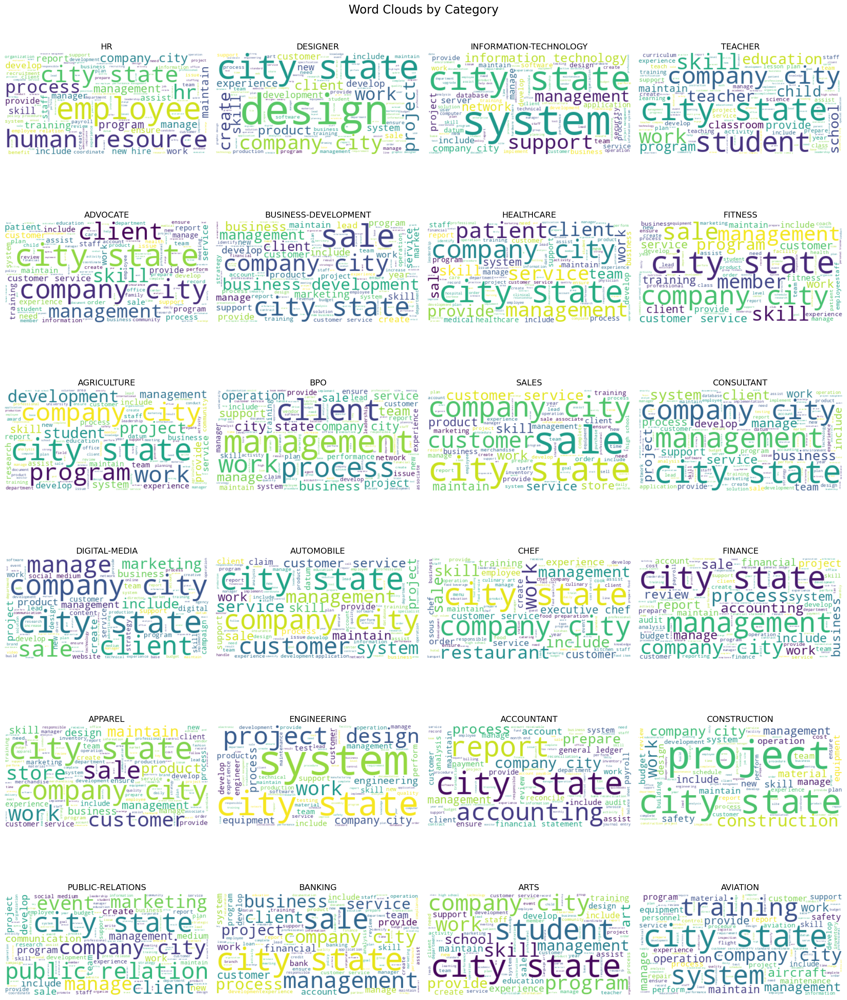

In [10]:
word_cloud_per_category(data, "cleaned_text", "word_cloud_per_category_cleaned_text.png")

### Plot label distribution

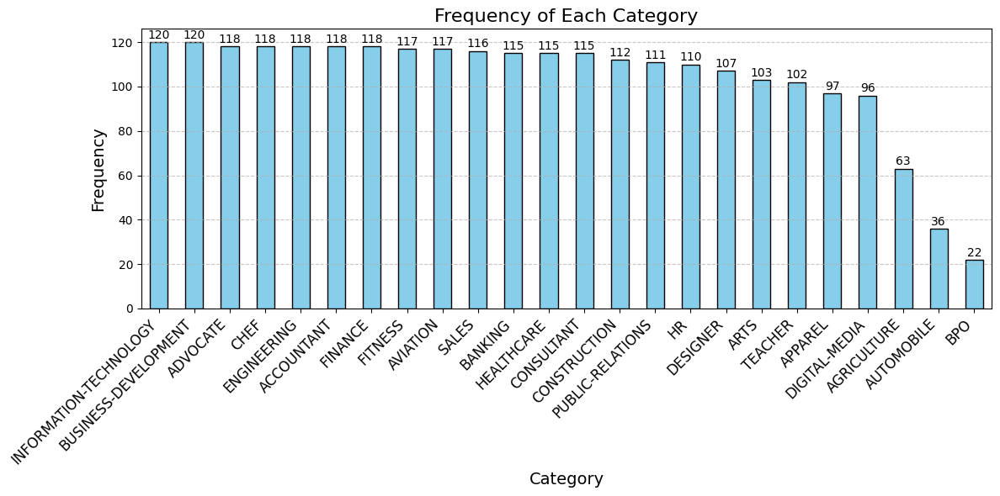

In [11]:
category_counts = data.Category.value_counts()

plt.figure(figsize=(12, 6))
bars = category_counts.plot(kind='bar', color='skyblue', edgecolor='black')

for i, count in enumerate(category_counts):
    plt.text(i, count + 0.5, str(count), ha='center', va='bottom', fontsize=10)

plt.title('Frequency of Each Category', fontsize=16)
plt.xlabel('Category', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.xticks(rotation=45, ha='right', fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
name_file = 'label_distribution.png'
plt.savefig(f'.//figures//{name_file}', dpi=400, bbox_inches="tight") 
plt.show()


## 3. Dataset Partitioning

In [12]:
# Create a mapping from category names to integers
label_to_idx = {label: idx for idx, label in enumerate(set(data["Category"]))}
idx_to_label = {idx: label for label, idx in label_to_idx.items()}

# Convert string labels (Category) to integers
data["numerical_labels"] = data["Category"].map(label_to_idx)

texts = data["cleaned_text"].tolist()
labels = data["numerical_labels"].tolist()

# Split into train+val and test sets first
texts_train_val, texts_test, labels_train_val, labels_test = train_test_split(
    texts, labels, test_size=0.2, stratify=labels, random_state=42
)

# Split train+val into train and validation sets
texts_train, texts_val, labels_train, labels_val = train_test_split(
    texts_train_val, labels_train_val, test_size=0.25, stratify=labels_train_val, random_state=42
)

print(f"Training Set: {len(texts_train)} samples")
print(f"Validation Set: {len(texts_val)} samples")
print(f"Test Set: {len(texts_test)} samples")


Training Set: 1490 samples
Validation Set: 497 samples
Test Set: 497 samples


## 4. Model Definition

In [13]:
class TextClassifier:
    def __init__(self, model_name, num_labels=24, device=None):
        """
        Initialize the TextClassifier.
        Args:
            model_name (str): The name of the pre-trained model.
            num_labels (int): Number of classification labels.
            device (str): Device to use ('cuda' or 'cpu'). Defaults to auto-detection.
        """
        self.num_labels = num_labels
        self.device = device if device else ("cuda" if torch.cuda.is_available() else "cpu")
        self.tokenizer = AutoTokenizer.from_pretrained(model_name)
        self.model_name = model_name

    def initialize_bert(self):
        """
        Initialize a BERT model for classification.
        """
        self.model = BertForSequenceClassification.from_pretrained(self.model_name, num_labels=self.num_labels)
        self.model.to(self.device)

    def initialize_distilbert(self):
        """
        Initialize a DistilBERT model for classification.
        """
        self.model = DistilBertForSequenceClassification.from_pretrained(self.model_name, num_labels=self.num_labels)
        self.model.to(self.device)

    def freeze_base_model(self):
        """
        Freeze all layers except the classification layer.
        """
        for param in self.model.base_model.parameters():
            param.requires_grad = False

    def train_and_save_best_model(self, train_loader, val_loader, test_loader, 
                                  optimizer, criterion, epochs, save_path, patience):
        """
        Train the model and return best validation metric, test metric, and training 
        metric at best validation performance.
        Args:
            train_loader: DataLoader for training data.
            val_loader: DataLoader for validation data.
            test_loader: DataLoader for test data.
            optimizer: Optimizer for training.
            criterion: Loss function.
            epochs: Maximum number of epochs.
            save_path: Path to save the best model.
            patience: Number of epochs to wait before early stopping.
        """
        
        best_val_metric = float('-inf')
        best_model_path = save_path
        
        train_accuracies = []
        val_accuracies = []
        train_losses = []
        no_improvement_epochs = 0 
    
        for epoch in range(epochs):
            self.model.train()
            total_loss = 0
            correct = 0
            total = 0
    
            # Training Loop
            for batch in train_loader:
                optimizer.zero_grad()
                input_ids = batch["input_ids"].to(self.model.device)
                attention_mask = batch["attention_mask"].to(self.model.device)
                labels = batch["labels"].to(self.model.device)
    
                outputs = self.model(input_ids, attention_mask=attention_mask, labels=labels)
                loss = outputs.loss
                total_loss += loss.item()
                
                preds = torch.argmax(outputs.logits, dim=1)
                correct += (preds == labels).sum().item()
                total += labels.size(0)
                
                loss.backward()
                optimizer.step()

            train_loss = total_loss / len(train_loader)
            train_accuracy = correct / total
            train_losses.append(train_loss)
            train_accuracies.append(train_accuracy)
    
            # Validation Step
            val_metric = self.evaluate_model(val_loader)
            val_accuracies.append(val_metric)
    
            # Save the best model
            if val_metric > best_val_metric:
                best_val_metric = val_metric
                torch.save(self.model.state_dict(), best_model_path)
                no_improvement_epochs = 0 
                test_metric = self.evaluate_model(test_loader)
                best_val_metric = val_metric
                train_metric_at_best_val = train_accuracy
            else:
                no_improvement_epochs += 1

            if no_improvement_epochs >= patience:
                print("Early stopping triggered. Stopping training.")
                break
                
        self.plot_metrics(train_accuracies, val_accuracies, train_losses, len(train_accuracies))
        return best_val_metric, test_metric, train_metric_at_best_val, len(train_accuracies)

    def evaluate_model(self, val_loader):
        """
        Evaluate the model on validation data.
        Args:
            val_loader (DataLoader): DataLoader for validation data.
        """
        self.model.eval()
        predictions, true_labels = [], []

        with torch.no_grad():
            for batch in val_loader:
                input_ids = batch["input_ids"].to(self.device)
                attention_mask = batch["attention_mask"].to(self.device)
                labels = batch["labels"].to(self.device)

                outputs = self.model(input_ids, attention_mask=attention_mask)
                preds = torch.argmax(outputs.logits, dim=1)

                predictions.extend(preds.cpu().numpy())
                true_labels.extend(labels.cpu().numpy())

        acc = accuracy_score(true_labels, predictions)
        return acc

    def plot_metrics(self, train_accuracies, val_accuracies, train_losses, epochs_completed):
        """
        Plot training and validation accuracies and training losses.
        """
        epochs_range = range(1, epochs_completed + 1)


        # Plot Accuracy
        plt.figure(figsize=(8, 4))
        plt.plot(epochs_range, train_accuracies, label="Training Accuracy")
        plt.plot(epochs_range, val_accuracies, label="Validation Accuracy")
        plt.title("Training and Validation Accuracy")
        plt.xlabel("Epochs")
        plt.ylabel("Accuracy")
        plt.legend(loc="best")
        plt.grid()
        model_type = self.model_name.split('-')[0]
        name_file = f'accuracy_{model_type}.png'
        plt.savefig(f'.//figures//{name_file}', dpi=400, bbox_inches="tight") 
        plt.show()

        # Plot Loss
        plt.figure(figsize=(8, 4))
        plt.plot(epochs_range, train_losses, label="Training Loss")
        plt.title("Training Loss")
        plt.xlabel("Epochs")
        plt.ylabel("Loss")
        plt.legend(loc="best")
        plt.grid()
        name_file = f'loss_{model_type}.png'
        plt.savefig(f'.//figures//{name_file}', dpi=400, bbox_inches="tight")
        plt.show()


In [14]:
class CustomDataset(Dataset):
    def __init__(self, texts, labels, tokenizer, max_length=128):
        self.texts = texts
        self.labels = labels
        self.tokenizer = tokenizer
        self.max_length = max_length

    def __len__(self):
        return len(self.texts)

    def __getitem__(self, idx):
        text = self.texts[idx]
        label = self.labels[idx]
        encoding = self.tokenizer(
            text,
            max_length=self.max_length,
            padding="max_length",
            truncation=True,
            return_tensors="pt"
        )
        return {
            "input_ids": encoding["input_ids"].squeeze(0),
            "attention_mask": encoding["attention_mask"].squeeze(0),
            "labels": torch.tensor(label, dtype=torch.long)
        }

### 4.1. Setup tokenizer for BERT and DistilBERT Models

In [15]:
tokenizer = AutoTokenizer.from_pretrained("bert-base-uncased")

train_dataset = CustomDataset(texts_train, labels_train, tokenizer)
val_dataset = CustomDataset(texts_val, labels_val, tokenizer)
test_dataset = CustomDataset(texts_test, labels_test, tokenizer)

train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=16)
test_loader = DataLoader(test_dataset, batch_size=16)

### 4.2. Train BERT Model for Resume Classification

Some weights of BertForSequenceClassification were not initialized from the model checkpoint at bert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Early stopping triggered. Stopping training.


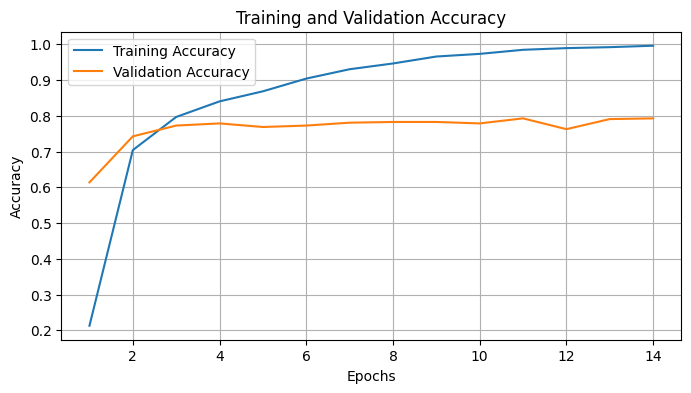

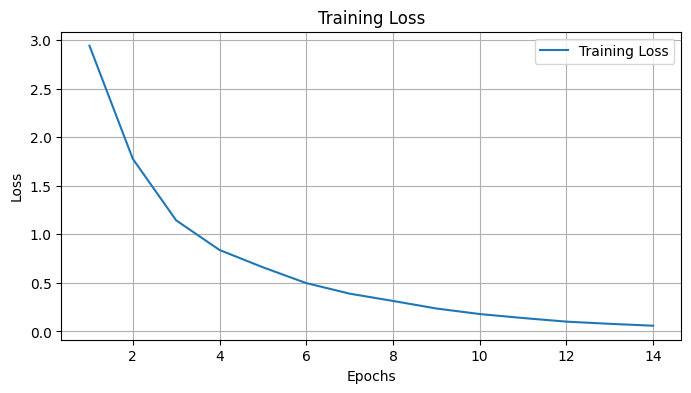

Average Time Per Epoch: 18.76 seconds


In [16]:
# Initialize the TextClassifier with BERT Model
model_name = "bert-base-uncased"
num_labels = 24  
classifier_bert = TextClassifier(model_name=model_name, num_labels=num_labels)

# Initialize the BERT model
classifier_bert.initialize_bert()

optimizer = AdamW(classifier_bert.model.parameters(), lr=2e-5, eps=1e-8)
criterion = nn.CrossEntropyLoss()

epochs = 50
save_path = ".//bert-resume-classification//best_model.bin"

start_time = time.time()

# Train the model
best_val_BERT, test_BERT, train_BERT_at_best_val, final_epoch = classifier_bert.train_and_save_best_model(
    train_loader=train_loader,  
    val_loader=val_loader, 
    test_loader = test_loader,
    optimizer=optimizer,
    criterion=criterion,
    epochs=epochs,
    save_path=save_path,
    patience=3
)

end_time = time.time()
total_time = end_time - start_time
avg_time_per_epoch = total_time / final_epoch

print(f"Average Time Per Epoch: {avg_time_per_epoch:.2f} seconds")


### 4.2. Train DistilBERT Model for Resume Classification

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Early stopping triggered. Stopping training.


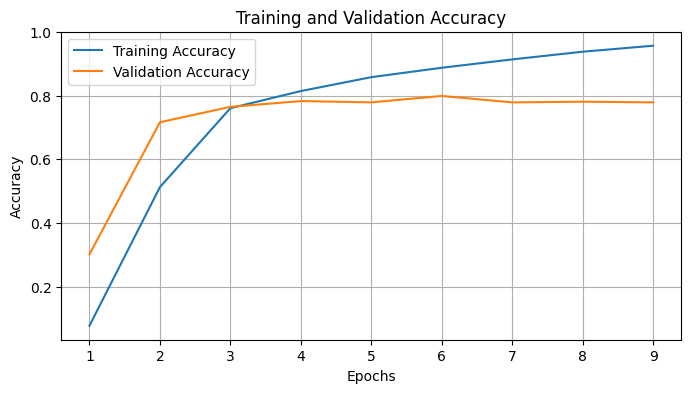

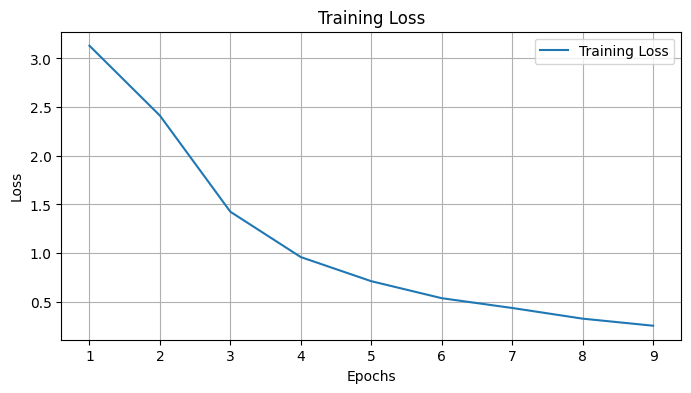

Average Time Per Epoch: 10.32 seconds


In [17]:
# Initialize the TextClassifier
model_name = "distilbert-base-uncased"
num_labels = 24  # Replace with the number of your categories
classifier_distil_bert = TextClassifier(model_name=model_name, num_labels=num_labels)

# Initialize the BERT model
classifier_distil_bert.initialize_distilbert()

# Define optimizer and loss function
optimizer = AdamW(classifier_distil_bert.model.parameters(), lr=2e-5, eps=1e-8)
criterion = nn.CrossEntropyLoss()

# Training hyperparameters
epochs = 50
save_path = ".//distilbert-resume-classification//best_model.bin"  # Path to save the best model


start_time = time.time()

# Train the model
best_val_DistilBERT, test_DistilBERT, train_DistilBERT_at_best_val, final_epoch = classifier_distil_bert.train_and_save_best_model(
    train_loader=train_loader,  
    val_loader=val_loader, 
    test_loader = test_loader,
    optimizer=optimizer,
    criterion=criterion,
    epochs=epochs,
    save_path=save_path,
    patience=3
)

end_time = time.time()
total_time = end_time - start_time
avg_time_per_epoch = total_time / final_epoch

print(f"Average Time Per Epoch: {avg_time_per_epoch:.2f} seconds")

In [18]:
print(best_val_BERT, test_BERT, train_BERT_at_best_val)

0.7927565392354124 0.8048289738430584 0.9845637583892617


In [19]:
print(best_val_DistilBERT, test_DistilBERT, train_DistilBERT_at_best_val)

0.7987927565392354 0.8008048289738431 0.887248322147651


In [20]:
def plot_confusion_matrix(classifier, save_path, data_loader, output_path):
    # 1. Load the best model
    classifier.model.load_state_dict(torch.load(save_path))  # Load saved model
    classifier.model.eval()  # Set model to evaluation mode
    
    # 2. Make predictions on the test set
    all_preds = []
    all_labels = []
    
    with torch.no_grad():  # Disable gradient computation for inference
        for batch in data_loader:
            input_ids = batch["input_ids"].to(classifier.device)
            attention_mask = batch["attention_mask"].to(classifier.device)
            labels = batch["labels"].to(classifier.device)
    
            outputs = classifier.model(input_ids, attention_mask=attention_mask)
            preds = torch.argmax(outputs.logits, dim=1)
    
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
    
    # 3. Compute the confusion matrix
    cm = confusion_matrix(all_labels, all_preds)
    category_names = [idx_to_label[i] for i in range(len(idx_to_label))]
    
    # 4. Visualize the confusion matrix
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=category_names)
    disp.plot(cmap="Blues")
    plt.xticks(rotation=90)
    
    plt.savefig(output_path, dpi=400, bbox_inches="tight") 
    # Show the plot (optional)
    plt.show()

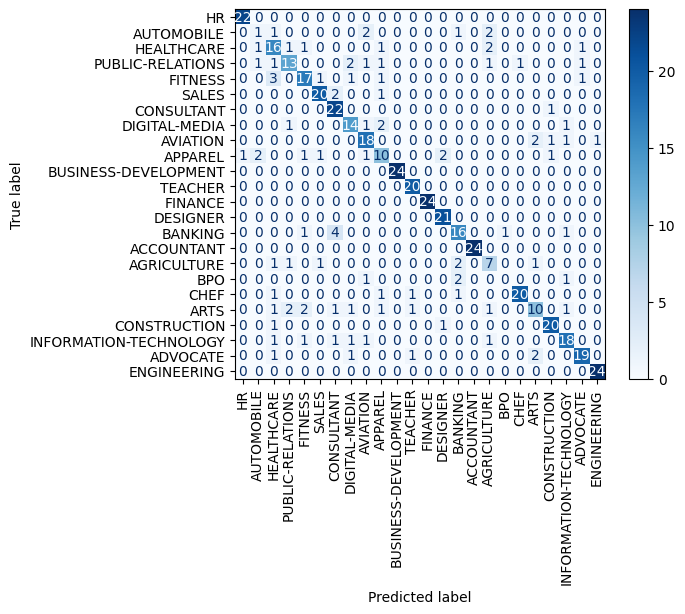

In [21]:
save_path = ".//bert-resume-classification//best_model.bin"
output_path = ".//figures//bert_confusion_matrix.png"
plot_confusion_matrix(classifier_bert, save_path, test_loader, output_path)

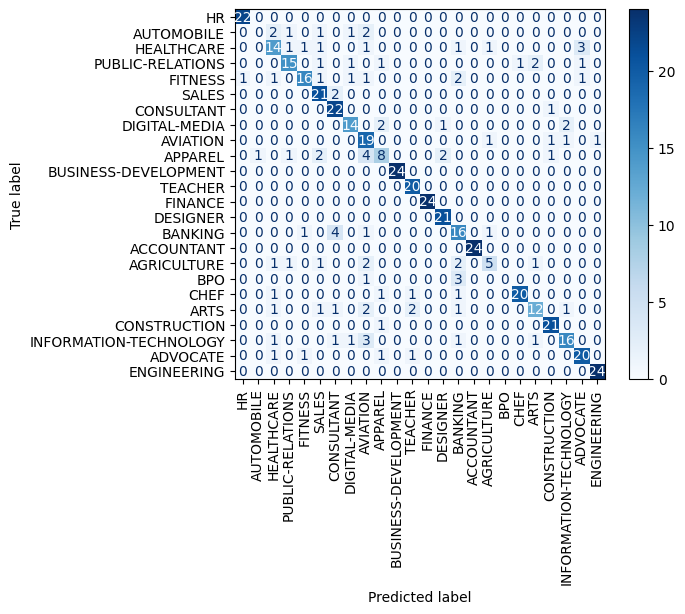

In [22]:
save_path = ".//distilbert-resume-classification//best_model.bin"
output_path = ".//figures//distil_bert_confusion_matrix.png"
plot_confusion_matrix(classifier_distil_bert, save_path, test_loader, output_path)